# **PART-1: Uploading labelled images and their data. Morever, confirming thier presence.**

# Importing Required libraries

In [1]:
!pip3 install torch==1.8.2 torchvision==0.9.2 torchaudio===0.8.2 --extra-index-url https://download.pytorch.org/whl/lts/1.8/cu111

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/, https://download.pytorch.org/whl/lts/1.8/cu111
     |█████████████▌                  | 834.1 MB 1.4 MB/s eta 0:14:04tcmalloc: large alloc 1147494400 bytes == 0x6595e000 @  0x7fe2c1e03615 0x58ead6 0x4f355e 0x4d222f 0x51041f 0x5b4ee6 0x58ff2e 0x510325 0x5b4ee6 0x58ff2e 0x50d482 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4bac0a 0x538a76 0x590ae5 0x510280 0x5b4ee6 0x58ff2e 0x50d482 0x5b4ee6 0x58ff2e 0x50c4fc 0x58fd37 0x50ca37 0x5b4ee6 0x58ff2e
     |█████████████████               | 1055.7 MB 1.3 MB/s eta 0:11:59tcmalloc: large alloc 1434370048 bytes == 0x3186000 @  0x7fe2c1e03615 0x58ead6 0x4f355e 0x4d222f 0x51041f 0x5b4ee6 0x58ff2e 0x510325 0x5b4ee6 0x58ff2e 0x50d482 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4bac0a 0x538a76 0x590ae5 0x510280 0x5b4ee6 0x58ff2e 0x50d482 0x5b4ee6 0x58ff2e 0x50c4fc 0x58fd37 0x50ca37 0x5b4ee6 0x58ff2e
     |█████████████████████▋     

In [2]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import numpy as np
import random
#We will need glob for capturing file paths in a directory, matplotlib for visualization, and cv2 for reading images.

Below, we have a boolean called TRAIN. If this is True, then running the code will train all the three models in the notebooks. If we provide the value as False, then if any previously trained model is present in the result directory, it will be used for inference. This is a good measure to ensure that we need not train all the models each time if we want to carry out inference.

In [3]:
TRAIN = True
# Number of epochs to train for.
EPOCHS = 25
#Above, we have a boolean called TRAIN. If this is True, then running the code will train all the three models in the notebooks. If we provide the value as False, then if any previously trained model is present in the result directory, it will be used for inference. This is a good measure to ensure that we need not train all the models each time if we want to carry out inference.


The following function is for downloading any file in the notebook. Further on, we will use it for downloading the inference dataset.

In [4]:
def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
        file = requests.get(url)
        # W = write, b = save as bianry files
        open(save_name, 'wb').write(file.content)
    else:
        print('File already present, skipping download...')


**Uploading labelled data**

In [5]:
if not os.path.exists('train'):
    !curl -L "https://app.roboflow.com/ds/wFu6iAbSob?key=IACrAzNDwy" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   3033      0 --:--:-- --:--:-- --:--:--  3033
100 14.7M  100 14.7M    0     0  23.2M      0 --:--:-- --:--:-- --:--:-- 23.2M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/frame0_png.rf.0cc3360d50977b6da46d6c6eb9d4749d.jpg  
 extracting: test/images/frame0_png.rf.820bc61b1011f6ccacd18ecfac22835c.jpg  
 extracting: test/images/frame13_png.rf.b4cc9bc08986f7fe476f9b49090fbbb1.jpg  
 extracting: test/images/frame1_png.rf.105f0edef36931c6d4837237acb721af.jpg  
 extracting: test/images/frame21_png.rf.d0a7c4bea3c29f24d4a3ab99a8def737.jpg  
 extracting: test/images/frame3_png.rf.55d01ca6cd95d64bce83bf0c68b4f409.jpg  
 extracting: test/images/frame3_

In [7]:
# class_names will help to write name in the bounding boxes
class_names = ['ACW_Vortex', 'CW_Vortex'] 
# It will help to choose different colors for different classes
colors = np.random.uniform ( 0 , 255 , size = ( len ( class_names ) , 3 ) )
print(colors)

[[103.82528383  67.81203088 186.16242512]
 [224.16263527  12.88204039  51.8646021 ]]


In [9]:
# Function to convert bounding boxes in YOLO format to xmin ymin , xmax , ymax :
# bbox[0]/[1]/[2]/[3]=x-center/y-center/width/height of labelled rectangle
def yolo2bbox ( bboxes ):
    xmin , ymin = bboxes [ 0 ] -bboxes [ 2 ] / 2 , bboxes [ 1 ] -bboxes [ 3 ] / 2
    xmax , ymax = bboxes [ 0 ] + bboxes [ 2 ] / 2 , bboxes [ 1 ] + bboxes [ 3 ] / 2 
    return xmin , ymin , xmax , ymax 

In [12]:
def plot_box ( image , bboxes , labels): 
    # Need the image height and width to denormalize 
    # the bounding box coordinates 
    h,w,_ = image.shape 

    # bbox contains information of all the bounding boxes within one perticular images
    for box_num,box in enumerate(bboxes): 
        # Converting yolo X_Centre and Y_Centre to Left_Top corner and Bottom_Right corner
        x1 , y1 , x2 , y2 = yolo2bbox(box)

        # denormalize the coordinates
        xmin = int(x1*w) 
        ymin = int(y1*h) 
        xmax = int(x2*w) 
        ymax = int(y2*h) 
        width = xmax - xmin 
        height = ymax - ymin 

        # class_name will take 0(for ACW_Vortex) and 1(for CW_Vortex) 
        class_name = class_names[int(labels[box_num])]

        # Will draw rectangle
        cv2.rectangle(
            image,
            (xmin,ymin), (xmax,ymax),
            color = colors[class_names.index(class_name)],
            thickness = 2
        )
        # Choosing different parameters for text in standard way
        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2,max(10,int(w/50)))

        p1, p2 = (int(xmin), int(ymin)), (int(xmax),int(ymax))

        #Text width and height

        tw, th = cv2.getTextSize(
            class_name,
            0, fontScale = font_scale, thickness = font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        # To draw the rectanfgle around the text
        # cv2.rectangle(
        #     image,
        #     p1,p2,
        #     color = colors[class_names.index(class_name)],
        #     thickness = -1,
        # )
        # cv2.putText(
        #     image,
        #     class_name,
        # (xmin+1, ymin-10),
        # cv2.FONT_HERSHEY_SIMPLEX,
        # font_scale,
        # (255,255,255),
        # font_thickness
        # )
    return image

In [13]:
# Function to plot images with the bounding boxes . 
# Mainly "plot" function take the image and respectibe labels data and plot_box function draw the OpenCv rectangle
def plot( image_paths , label_paths , num_samples ) : 
  # Taking iamge_path and save it in all_training_images
  all_training_images = glob.glob(image_paths) 
  # Taking label_path and save it in all_training_labels
  all_training_labels = glob.glob(label_paths)
  # Sorting ianfes and labels path
  all_training_images.sort( )
  all_training_labels.sort( ) 
  
  # Calculating total number of images in the given path
  num_images = len(all_training_images) 
  
  plt.figure(figsize = ( 15 , 12 ) ) 
  
  for i in range (num_samples) : 
      # Selecting any random number in between 0 to (total number of images)
      j = random.randint(0,num_images-1) 
      # Reading jth image
      image = cv2.imread(all_training_images[j])
      # Opening of jth labelling file and reading it save as f
      with open(all_training_labels[j],'r') as f : 
        bboxes = [ ]
        labels = [ ] 
        #Python readline() is a file method that helps to read one complete line from the given file. 
        #The readlines() method returns a list containing each line in the file as a list item.
        label_lines = f.readlines( )
        for label_line in label_lines:
          # First charecter in each line is CLASS NUMBER
          label = label_line[0]
          # X_centre_coordinate, y_center_coordinate,width,height
          bbox_string = label_line[2:]
          x_c, y_c,w, h = bbox_string.split(' ')
          x_c = float(x_c)
          y_c = float(y_c)
          w = float(w)
          h = float(h)
          # Saving all the values in the bbox matrix(array) for perticular image
          bboxes.append([x_c, y_c, w, h])
          # Saving just CLASS NAME in the labels matrix(array) for perticular image
          labels.append(label)
      # Will draw the rectangle at the detected region
      result_image = plot_box(image, bboxes, labels)
      plt.subplot(2, 2, i+1)
      plt.imshow(result_image[:,:,::-1])
      plt.axis('off')
  plt.subplots_adjust(wspace = 0)
  plt.tight_layout()
  plt.show()

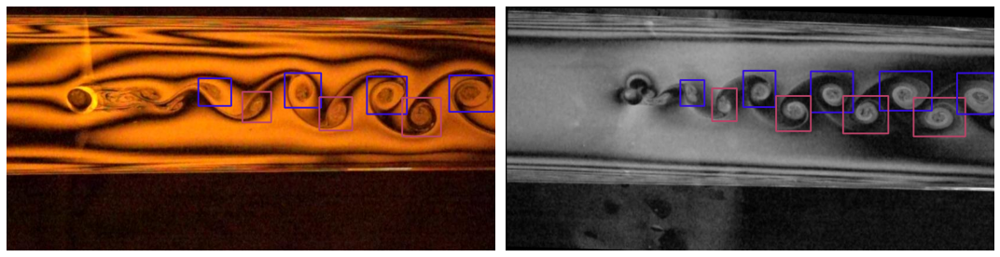

In [14]:
# #Visualize a few training images .
plot(image_paths = 'train/images/*',
      label_paths = 'train/labels/*', 
      num_samples= 2
) 

# **Part-2: Traning and Preparing model from custom data set.**

**Helper Function for Logging**

Here , we write the helper functions that we need for logging of the results in the notebook while training the models . Let's create our custom result directories so that we can easily keep track of them and carry out inference using the proper model.

In [18]:
def set_res_dir():
  # Directory to store results
  # Finding number of files in the 'train' folder
  res_dir_count = len(glob.glob('runs/train/*'))
  print(f"Current number of result directories: {res_dir_count}")
  if TRAIN:
    # Increase the number of floder by 1 id TRAIN is true
    RES_DIR = f"results_{res_dir_count + 1 }"
    print(RES_DIR)
  else:
    RES_DIR = f"results_{res_dir_count}"
  return RES_DIR

# set_res_dir() will result in result_1 or result_2... 

**Funtion to Monitor TensorBoard logs.**

In [19]:
def monitor_tensorboard():
  %load_ext tensorboard
  %tensorboard --logdir runs/train

Cone YOLOV5 Repository

For using any of the functionalities of the YOLOv5 codebase, we need to clone their repository. The next few lines of code clone the repository, enter into the yolov5 directory and install all the requirements that we may need for running the code.
https://github.com/ultralytics/yolov5

In [20]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 14166, done.
remote: Counting objects: 100% (106/106), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 14166 (delta 64), reused 84 (delta 51), pack-reused 14060
Receiving objects: 100% (14166/14166), 13.54 MiB | 30.01 MiB/s, done.
Resolving deltas: 100% (9727/9727), done.


In [21]:
# I thnk so, it will change the directory
%cd yolov5/
!pwd

/content/yolov5
/content/yolov5


In [22]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 182 kB 5.2 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
     |████████████████████████████████| 1.6 MB 59.9 MB/s 


In [49]:
monitor_tensorboard()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1104), started 0:20:04 ago. (Use '!kill 1104' to kill it.)

<IPython.core.display.Javascript object>

In [24]:
# rm= Remove result_ directory forcefully(-rf)

!rm -rf runs/train/results_1/

In [25]:
!pip install wandb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 5.0 MB/s 
     |████████████████████████████████| 168 kB 50.7 MB/s 
     |████████████████████████████████| 168 kB 50.6 MB/s 
     |████████████████████████████████| 166 kB 74.0 MB/s 
     |████████████████████████████████| 166 kB 63.3 MB/s 
     |████████████████████████████████| 162 kB 71.3 MB/s 
     |████████████████████████████████| 162 kB 73.8 MB/s 
     |████████████████████████████████| 158 kB 76.7 MB/s 
     |████████████████████████████████| 157 kB 75.3 MB/s 
     |████████████████████████████████| 157 kB 79.9 MB/s 
     |████████████████████████████████| 157 kB 74.2 MB/s 
     |████████████████████████████████| 157 kB 74.3 MB/s 
     |████████████████████████████████| 157 kB 78.8 MB/s 
     |████████████████████████████████| 157 kB 67.7 MB/s 
     |████████████████████████████████| 157 kB 69.6 MB/s 
     |██████████████████████████

1.   First, we are creating a new directory for saving the results. The path for that is saved in the RES_DIR variable. You will find the entire function definition for set_res_dir in the notebook. This is important because we want to control where the results are saved. Else, the script will create its own directories as run_1, run_2, and so on, while executing the train.py script.
2.   **--data**: This accepts the path to the dataset YAML file that we created earlier. In our case, it is one directory back to the current directory, and that’s why it is ../data.yaml.
3. **--weights**: This argument accepts the model which we want to use for training. As we are using the small model from the YOLOv5 family, the value is yolov5s.pt.
4. **--img**: We can also control the image size while training. The images will be resized to this value before being fed to the network. We are resizing them to 640 pixels which is also one of the most common ones used.
5. **--epochs**: This argument is used to specify the number of epochs. As we have already specified the number of epochs in the EPOCHS variable above, we provide that here.
6. **--batch-size**: This is the number of samples that will be loaded into one batch while training. Although the value is 16 here, you can change it according to the GPU memory that is available.
7. **--name**: We can provide a custom directory name where all the results will be saved. In our case, we provide a path that we just created by calling the set_res_dir function.

* After executing the above code, the training will begin and it will take some time depending on the hardware. It is highly recommended that you run all the training on a GPU.

* Also, in the end, you can see it shows the custom directory where all the results are saved.



In [27]:
# set_res_dir() will auto increment the result directory when TRAIN = True
RES_DIR = set_res_dir()
!python train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 1
results_2
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_2, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-8-g350e8eb Python-3.7.15 torch-1.8.2+cu111 CUDA:0 (Tesla T4, 15110MiB)

hyperpar

# **Visualize and Inference Utilites**
We will visualize the validation images that are saved during training. The following function for that.

During training, the codebase saves the predictions from the validation batches on each epoch to the result directory. Before we can check those out, let’s write a helper function that will find all the validation predictions in a result directory and show them. 

In [29]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR): 

    !ls runs/train/{RES_DIR} # will list all the file in the current directory

    # I think so all the path is with respect to the yolov5 folder
    EXP_PATH = f"runs/train/{RES_DIR}" 
    
    # I think so, just take the path of the images which have the _pred.jpg name at the end
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg") 
    print(validation_pred_images) 
    for pred_image in validation_pred_images:
       image = cv2.imread(pred_image)
       plt.figure(figsize = ( 19 , 16 ))
       plt.imshow(image[ :, : , :: - 1 ]) 
       plt.axis('off') 
       plt.show( )

The above function accepts the result directory path. We can visualize the images as follows.

confusion_matrix.png				    results.csv
events.out.tfevents.1669582190.e46dc55ffb9f.1332.0  results.png
F1_curve.png					    train_batch0.jpg
hyp.yaml					    train_batch1.jpg
labels_correlogram.jpg				    train_batch2.jpg
labels.jpg					    val_batch0_labels.jpg
opt.yaml					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    weights
['runs/train/results_2/val_batch0_pred.jpg', 'runs/train/results_2/val_batch1_pred.jpg']


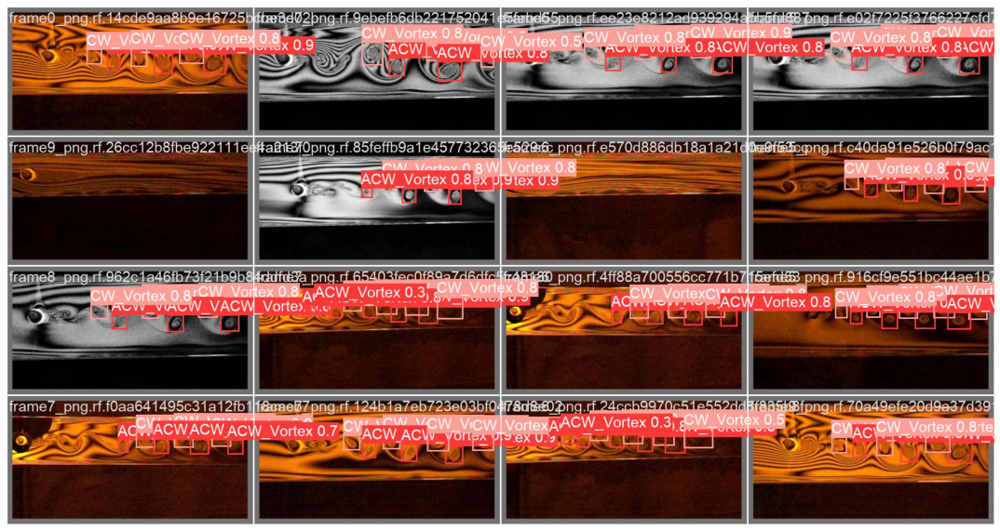

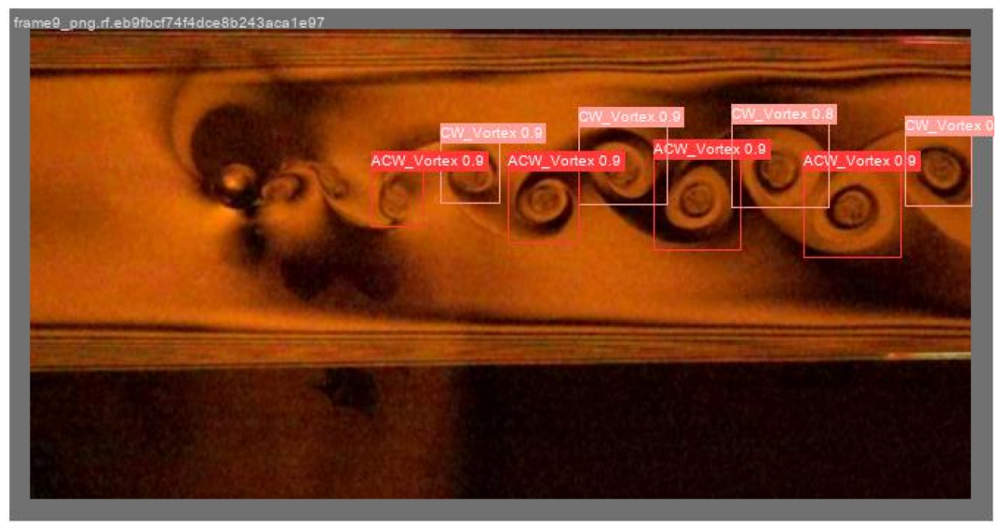

In [30]:
show_valid_results(RES_DIR)
 # I think so, below will be only two images because 16 is batch size and total number of validation images are 33.

* The inference function can be used for carrying out inference on images and videos when provided with the result directory path where the model is saved and the data path where the images/videos are present. Each time this function will create a new inference directory to save the results. 

* But the most important part here is the detect.py script which runs the inference. Going over the arguments will provide us with more insight into its working.

1. **--weights** : This argument is used to provide the path to the trained weights to be used for inference. And if you observe properly each time, we are using the best model, that is best.pt. 
2. **--source** : We need to provide the path where the images or videos are present.
3. **--name**: Finally, each time we use a custom directory to save the inference results so as to easily keep track of the results.

**NOTE: One thing to note here is that we are using the same detect.py script for inference on images and videos. The same detection script can run inference on both images and videos by checking the file extension and calling the appropriate methods.**

The following functions are for carrying out inference on images and videos.

In [46]:
# Helper functions for inference on images.
def inference(RES_DIR,data_path):
  # Directory to store inference results.
  
  infer_dir_count = len(glob.glob('runs/detect/*'))  # total number of file in detect floder

  print(f"Current number of inference detection dierectories: {infer_dir_count}")
  # Increasing total number of file by 1 for new detection 
  INFER_DIR = f"inference_{infer_dir_count+1}"  
  print(INFER_DIR)
  # Inference on images.
  !python detect.py --weight runs/train/{RES_DIR}/weights/best.pt  --source {data_path} --name {INFER_DIR} # we can use --thresh <value> to show the detection oly above certain condience
  return INFER_DIR

We may also need to visualize images in any of the directories. The following function accepts a directory path and plots all the images in them.

In [39]:
# Select random numbers between 0 to 17
rnd_array = np.random.randint(0,17,size = 10)

There is just one final helper function for visualizing the inference images stored on the disk after running detect.py. This will help us visualize the results directly in the Jupyter Notebook.

In [41]:
# This function will help to just visualize the saved images which are alredy detected and saved
def visualize(INFER_DIR):
  # Visualize inference images.
  # floder path to the saved inference result
  INFER_PATH = f"runs/detect/{INFER_DIR}"
  # extract path for all images in the given folder
  infer_images =  glob.glob(f"{INFER_PATH}/*.jpg")
  for i,pred_image in enumerate(infer_images):
    # if condition to break the for loop after i = 0,1,2,3
    if i == 4:
      break
    # read [0,1,2,3] images from infer_images(path)
    image = cv2.imread(infer_images[rnd_array[i]]) # will pick up ranf=dom image from the inference image set
    plt.figure(figsize = (12,9))
    plt.imshow(image[:,:,::-1])
    plt.axis('off')
    plt.show()

Visualize validation prediction images.

In [42]:
#show_valid_results(RES_DIR)

# **Inference on Images**
To carry out inference on images, we just need to provide, the directory path where all the images are stored, and inference will happen on all images automatically.

In [47]:
# Inference on images
IMAGE_INFER_DIR = inference(RES_DIR,'../test/images')

Current number of inference detection dierectories: 1
inference_2
detect: weights=['runs/train/results_2/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_2, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-8-g350e8eb Python-3.7.15 torch-1.8.2+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/17 /content/test/images/frame0_png.rf.0cc3360d50977b6da46d6c6eb9d4749d.jpg: 320x640 5 ACW_Vortexs, 4 CW_Vortexs, 15.2ms
image 2/17 /content/test/images/frame0_png.rf.820bc61b1011f6ccacd18ecfac22835c.jpg: 320x640 5 ACW_Vortexs, 4 CW_Vortexs, 9.8ms
image 3/17 /content

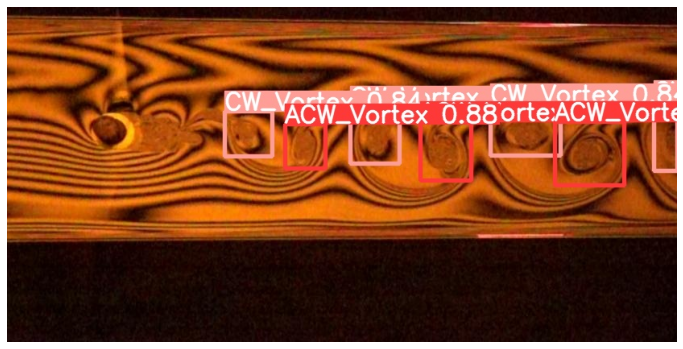

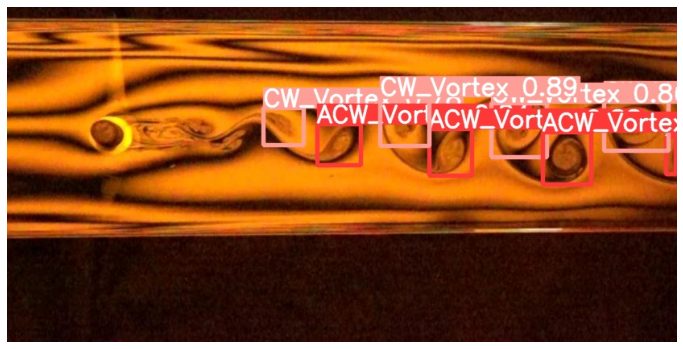

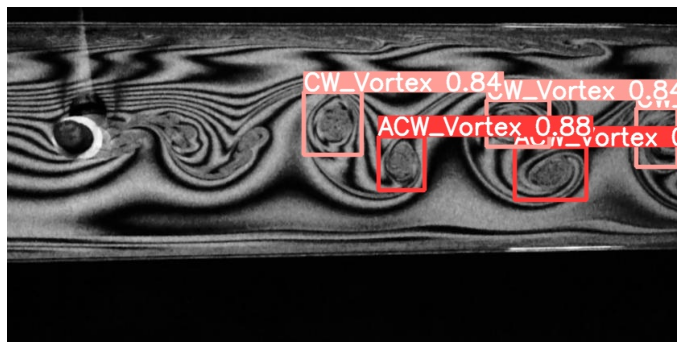

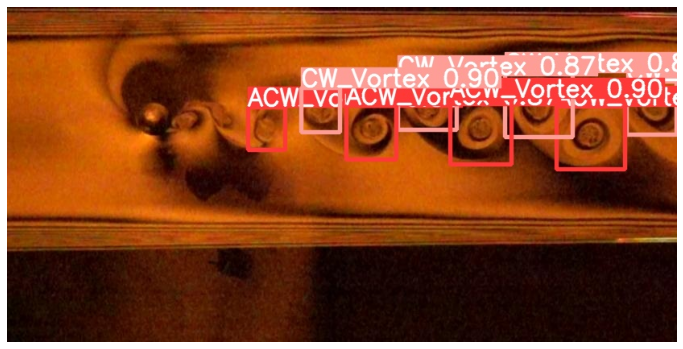

In [48]:
visualize(IMAGE_INFER_DIR)

# YOLOv5m

Next, we will run inference on videos by executing the video_inference function

In [ ]:
results = inference(RES_DIR, '/content/drive/MyDrive/IITK/f13_w9_d6.MP4')

Current number of inference detection dierectories: 2
inference_3
detect: weights=['runs/train/results_3/weights/best.pt'], source=/content/drive/MyDrive/IITK/f13_w9_d6.MP4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_3, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-314-g7f7bd6f Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/3720) /content/drive/MyDrive/IITK/f13_w9_d6.MP4: 384x640 5 ACW_Vortexs, 5 CW_Vortexs, Done. (0.018s)
video 1/1 (2/3720) /content/drive/MyDrive/IITK/f13_w9_d6.MP4: 384x640 5 ACW_Vortexs, 5 CW_Vortexs, Done. (0.011s)
video 1/1 (3/3720) /content/dr

In [ ]:
# RES_DIR = set_res_dir()
# if TRAIN:
#   !python train.py --data.ymal --weights yolov5m.pt \
#   --img 640 -epochs{EPOCHS} --batch-size 16 --name { RES_DIR} \
#   --freeze 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14